Haar cascade

Pixel -> Pontos que formam a imagem, é a menor informação presente na imagem.
   0 -> preto
   1 -> branco

 largura * altura * qtd_canais

 Costuma-se converter as imagens RGB para escaala de cinza em processamentos envolvendo redes neurais para econimizar processamento

 Classificador - Haar cascade

 Necessário dois conjuntos de imagens

   Conjunto de imagens positivas -> contém faces

   |||                 negativas -> imagens que não são faces

 Imagens > AdaBoost (detecta os padrões) > seleção de características > 
   As características são equivalentes a convolução com uma matriz (são as caracteristicas)
   
 Face = conjunto de várias características.

** Quanto maior a imagem maior o processamento necessário

In [ ]:
# Importando a biblioteca OpenCV
import cv2
from google.colab.patches import cv2_imshow
import dlib

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
imagem = cv2.imread('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/people1.jpg')

In [ ]:
# visualizar o shape (fromato) da imagem
# (altura, largura, qtdCanais)
imagem.shape

(1280, 1920, 3)

In [ ]:
# Redimensionar a imagem .resize(imagem, (altura, largura))
imagem = cv2.resize(imagem, (800, 600))
imagem.shape

(600, 800, 3)

**Detecção de faces**

In [ ]:
# Pode-se utilizar classificadores já treinados 
detector_facial = cv2.CascadeClassifier('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Cascades/haarcascade_frontalface_default.xml')

In [ ]:
deteccoes = detector_facial.detectMultiScale(imagem_cinza)

Qtd de linhas = qtd de faces detectadas. Cada linha uma face, padrão da linha:

[posicaoXdaFace, posicaoYdaFace, larguraFace, alturaFace]

In [ ]:
deteccoes 

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

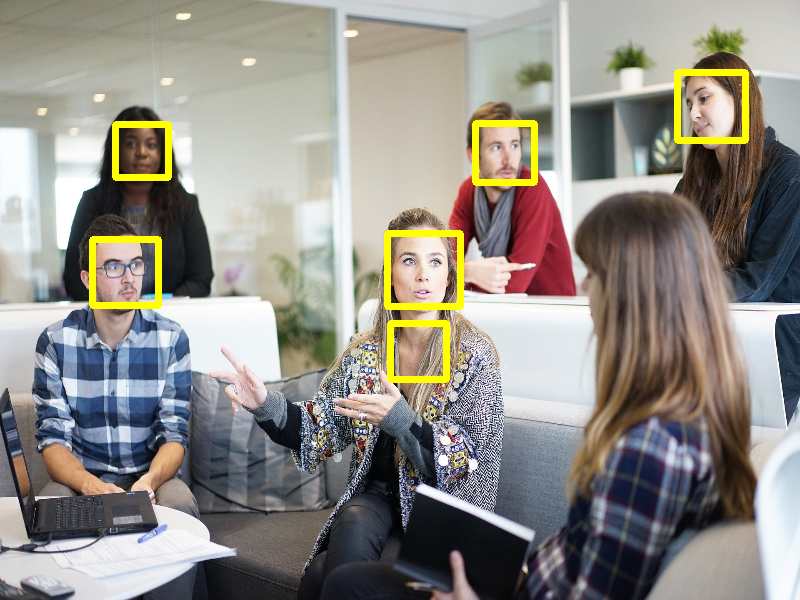

In [ ]:
# Criação dos bounding boxs
for x, y, w, h in deteccoes:
  cv2.rectangle(imagem, (x, y), (x + w, y + h), (0, 255, 255), 5)
cv2_imshow(imagem)

**Parâmetros para melhorar os resultados**

scaleFactor -> aumenta a escala da imagem. Util para faces muito pequenas na imagem.
Quanto menor o valor, mais tempo será necessário para o algoritmo executar. Relação: quanto maior a imagem maior será o scaleFactor, quanto menor a imagem, menor será o parâmetro.

minNeigbors -> número de retângulos para escolher o retângulo final. Quanto maior, maior é a certeza de que realmente é uma face o que foi detectado, contudo, diminui a quantidade de faces encontradas.

minSize -> tamanho minimo das faces para realizar a detecção

maxSize -> tamanho máximo da face



In [ ]:
def detectarFaces(caminho_imagem, isRedimensionar = True, fatorEscala = 1.1, numVizinhos = 5, tamMinimo = (10,10), tamMax = (100, 100)):
  imagem = cv2.imread(caminho_imagem)
  if isRedimensionar:
    imagem = cv2.resize(imagem, (800, 600))
  imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
  detector_facial = cv2.CascadeClassifier('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Cascades/haarcascade_frontalface_default.xml')
  
  deteccoes = detector_facial.detectMultiScale(imagem_cinza, scaleFactor=fatorEscala, minNeighbors=numVizinhos, minSize=tamMinimo, maxSize=tamMax)
  
  for x, y, w, h in deteccoes:
    cv2.rectangle(imagem, (x, y), (x + w, y + h), (0, 255, 255), 2)
  cv2_imshow(imagem)  


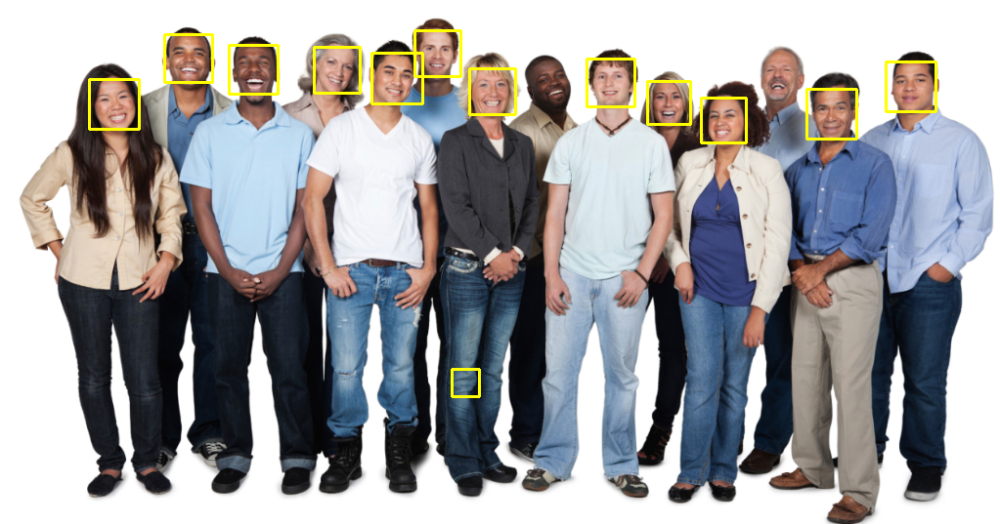

In [ ]:
detectarFaces('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/people2.jpg', False, 1.2, 5)

**Detecção de olhos**

In [ ]:
def detectarFacesEOlhos(caminho_imagem, isRedimensionar = True, fatorEscala = 1.1, numVizinhos = 5, tamMinimo = (10,10), tamMax = (100, 100)):
  imagem = cv2.imread(caminho_imagem)
  if isRedimensionar:
    imagem = cv2.resize(imagem, (800, 600))
  imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
  
  detector_facial = cv2.CascadeClassifier('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Cascades/haarcascade_frontalface_default.xml')
  deteccoes = detector_facial.detectMultiScale(imagem_cinza, scaleFactor=fatorEscala, minNeighbors=numVizinhos, minSize=tamMinimo, maxSize=tamMax)
  for x, y, w, h in deteccoes:
    cv2.rectangle(imagem, (x, y), (x + w, y + h), (0, 255, 255), 2)

  detector_olhos = cv2.CascadeClassifier('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Cascades/haarcascade_eye.xml')
  deteccoes_olhos = detector_olhos.detectMultiScale(imagem_cinza, scaleFactor=fatorEscala, minNeighbors=numVizinhos, minSize=tamMinimo, maxSize=tamMax)
  for x, y, w, h in deteccoes_olhos:
    cv2.rectangle(imagem, (x, y), (x + w, y + h), (0, 0, 255), 2)

  cv2_imshow(imagem)  

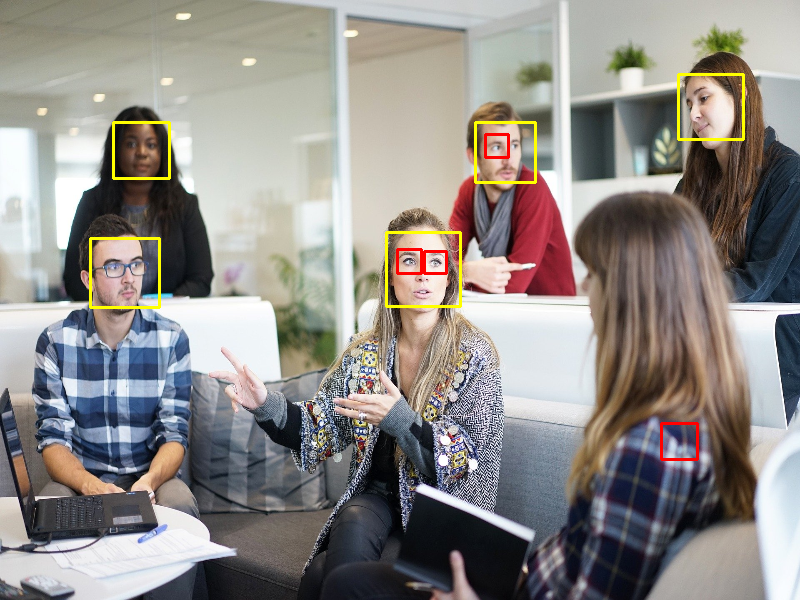

In [ ]:
detectarFacesEOlhos('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/people1.jpg', True, 1.09, 5, (30,30))

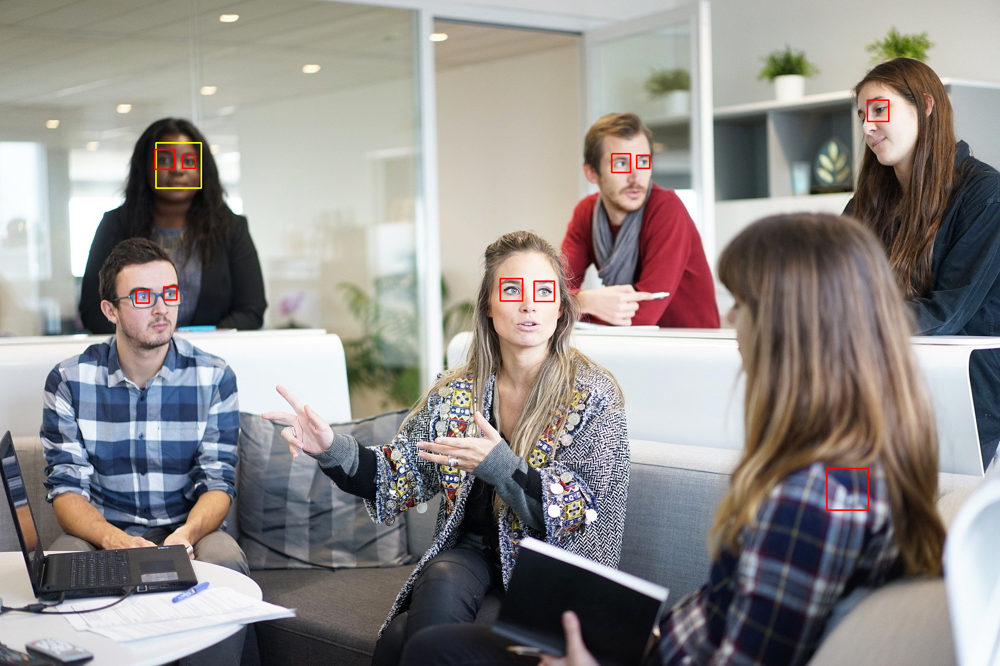

In [ ]:
detectarFacesEOlhos('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/people1.jpg', False, 1.09, 10, (30,30))

**HOG - Histograms Of Oriented Gradients**

Algoritmo -> selecionar o ROI -> redimensionar a imagem

Conceitos:

Derivada: mede o grau de mudança das cores na imagem.
Quanto maior a derivada, maior a variação da imagem (bordas). Derivada = 0, não existe variação na cor (objetos sólidos). Derivada pequena

Gradient vector: Direção que os valores aumentam. Aponta para os locais que apresentam maior variação de cores.

In [ ]:
# Importando a biblioteca
import dlib

In [ ]:
imagem = cv2.imread('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/people2.jpg')

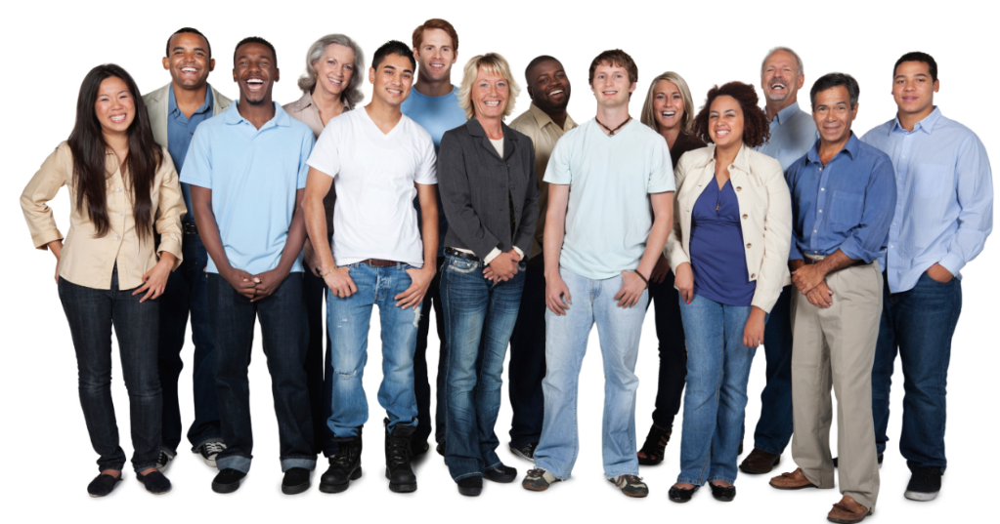

In [ ]:
cv2_imshow(imagem)

In [ ]:
# Criação do classificador HOG
detector_faces_hog = dlib.get_frontal_face_detector()

In [ ]:
deteccoes = detector_faces_hog(imagem, 1) # Escala da imagem -> 1 considera=se a imagem igual. Retorna o local e o tamanho da face detectada
# Quanto maior esse número maior o tempo necessário, também aumenta-se a confiança e diminui-se os bounding boxes

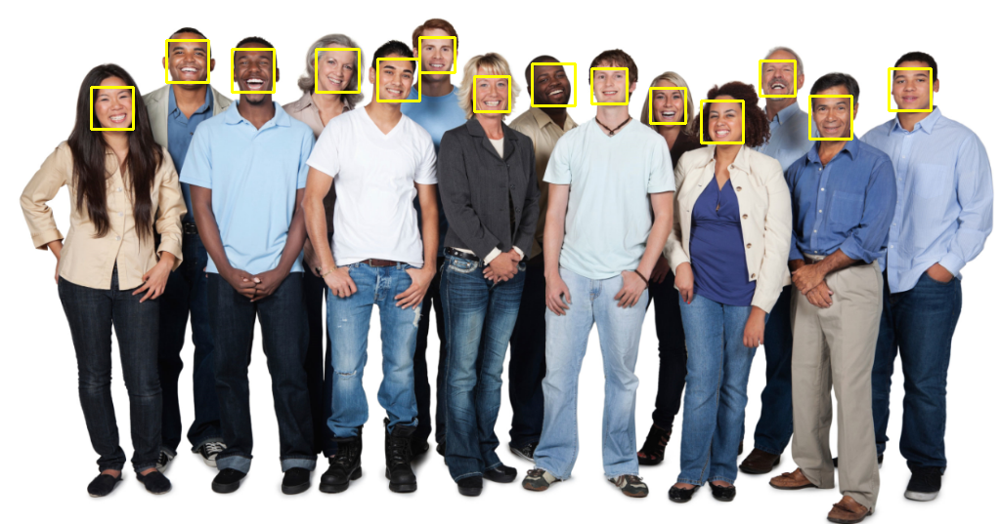

In [ ]:
for face in deteccoes:
  #print(face)
  #print(face.left()) # = x
  #print(face.right()) # largura
  #print(face.top()) # = y
  #print(face.bottom()) #altura
  cv2.rectangle(imagem, (face.left(), face.top()), (face.right(), face.bottom()), (0,255,255), 2)

cv2_imshow(imagem)

**Redes neurais convolucionais**

In [ ]:
imagem = cv2.imread('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/people2.jpg')

In [ ]:
detector_faces_cnn = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Weights/mmod_human_face_detector.dat') # Modelo treinado para a detecção de faces

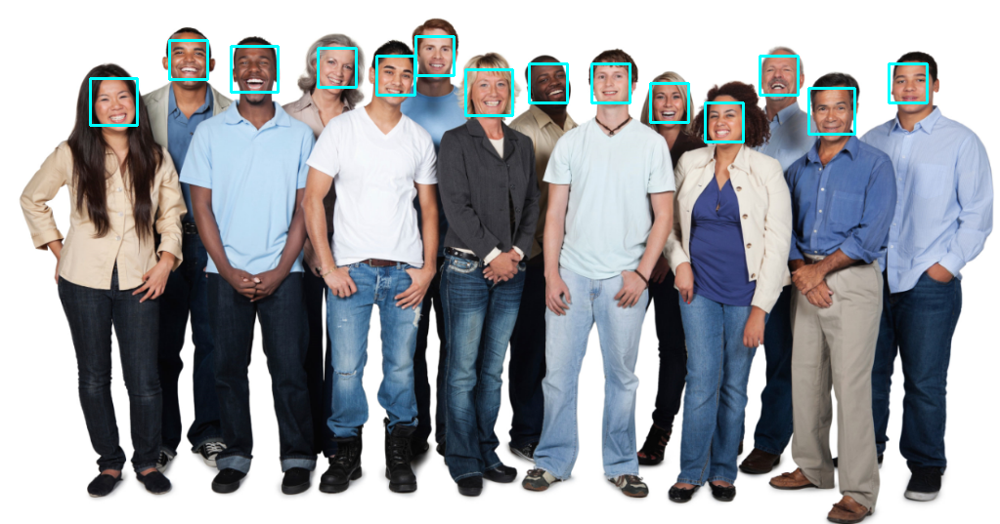

In [ ]:
deteccoes = detector_faces_cnn(imagem, 1)

for face in deteccoes:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence # c = confiança da detecção
  cv2.rectangle(imagem, (l, t), (r, b), (255, 255, 0), 2)

cv2_imshow(imagem)

**Detecção de carros, relógios e corpos de pessoas utilizando Haar Cascade**

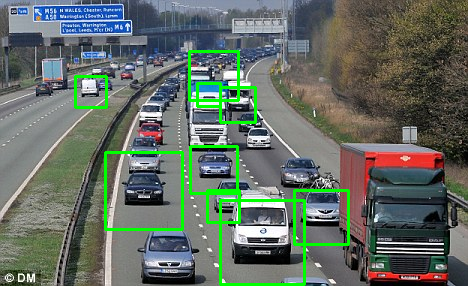

In [ ]:
detector_carros = cv2.CascadeClassifier('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Cascades/cars.xml')

imagem = cv2.imread('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/car.jpg')
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
deteccoes = detector_carros.detectMultiScale(imagem_cinza, scaleFactor = 1.03, minNeighbors = 5)

for (x, y, w, h) in deteccoes:
  cv2.rectangle(imagem, (x, y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(imagem)

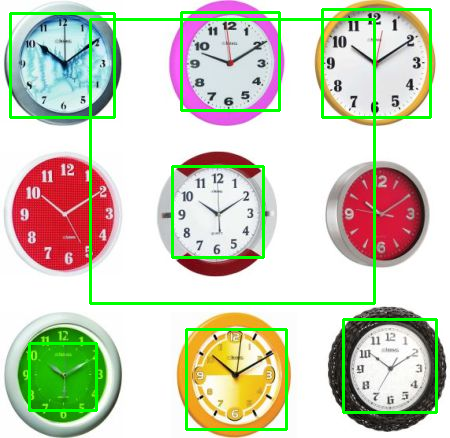

In [ ]:
detector_relogios = cv2.CascadeClassifier('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Cascades/clocks.xml')

imagem = cv2.imread('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/clock.jpg')
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
deteccoes = detector_relogios.detectMultiScale(imagem_cinza, scaleFactor = 1.03, minNeighbors = 1)

for (x, y, w, h) in deteccoes:
  cv2.rectangle(imagem, (x, y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(imagem)

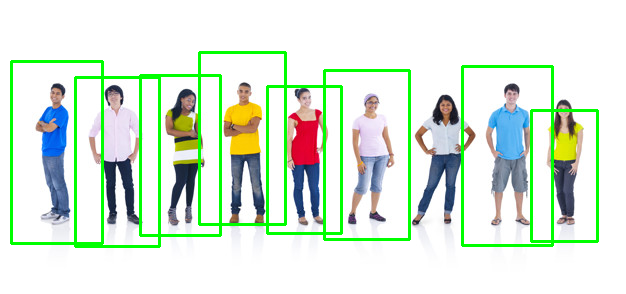

In [ ]:
detector_corpo = cv2.CascadeClassifier('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Cascades/fullbody.xml')

imagem = cv2.imread('/content/drive/MyDrive/Mestrado/Cursos - Udemy/Visão computacional/Recursos/Visão Computacional Guia Completo/Images/people3.jpg')
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
deteccoes = detector_corpo.detectMultiScale(imagem_cinza, scaleFactor = 1.05, minNeighbors = 5, minSize = (50,50))

for (x, y, w, h) in deteccoes:
  cv2.rectangle(imagem, (x, y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(imagem)